<a href="https://colab.research.google.com/github/rujool11/ML-learning/blob/main/opencv.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [60]:
import cv2 as cv
import matplotlib.pyplot as plt

In [61]:
cv.__version__ # opencv uses BGR, we have manipulated image using this system, but show() function changes it to RGB when displaying using plt.imshow()

'4.8.0'

In [62]:
import zipfile

zip_ref = zipfile.ZipFile('/content/images.zip')
zip_ref.extractall()
zip_ref.close()

In [63]:
import os
for i in os.listdir('/content/images'):
  print(i)

1200px-RedCat_8727.jpg
egypt_kitty_social.webp
amsterdam-cheap-time-7fb598bf.jpeg
download.jpeg


In [64]:
paths = []
for filename in os.listdir('/content/images'):
  paths.append('/content/images/' + filename)
print(paths)

['/content/images/1200px-RedCat_8727.jpg', '/content/images/egypt_kitty_social.webp', '/content/images/amsterdam-cheap-time-7fb598bf.jpeg', '/content/images/download.jpeg']


### **Reading and Displaying images**

In [65]:
img = cv.imread(paths[2])
img.shape, img.dtype

((600, 1060, 3), dtype('uint8'))

(-0.5, 1059.5, 599.5, -0.5)

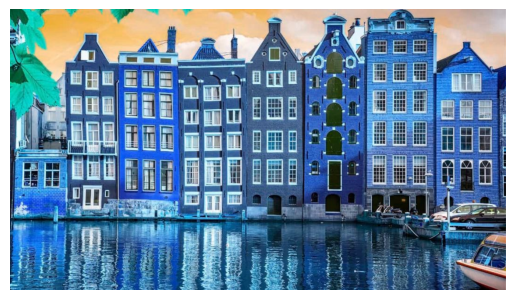

In [66]:
plt.imshow(img)
plt.axis(False)

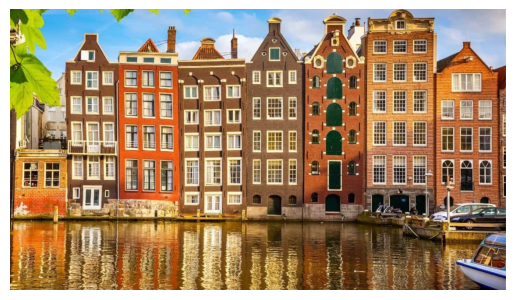

In [67]:
# opencv uses bgr by default , need to convert to rgb for compatibility with other libraries
rgb_img  = cv.cvtColor(img,cv.COLOR_RGB2BGR)
plt.imshow(rgb_img)
plt.axis(False);

In [68]:
def show(img):
  plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
  plt.axis(False)

### **Resizing and Rescaling**

In [69]:
def rescaleFrame(frame, scale=0.75):

  height = int(frame.shape[0]*scale)
  width = int(frame.shape[1]*scale)
  dimensions = (width, height)

  return cv.resize(frame, dimensions, interpolation=cv.INTER_AREA)

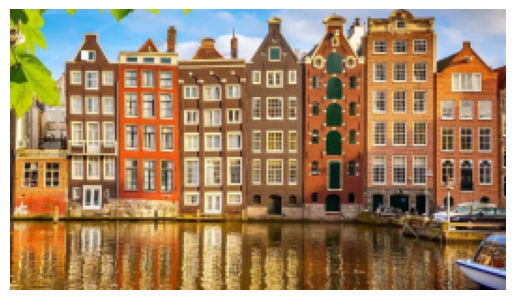

In [70]:
show(rescaleFrame(img, scale=0.25)) # as we can see image has lost quality since we resized down

### **Drawing**

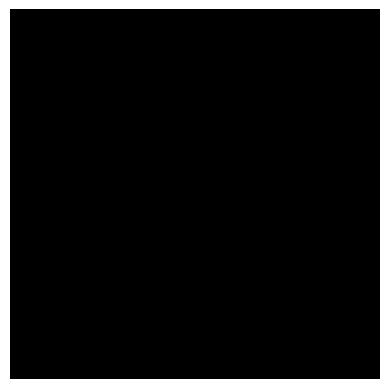

In [71]:
import numpy as np
solid = np.zeros((500,500,3), dtype='uint8')
show(solid)

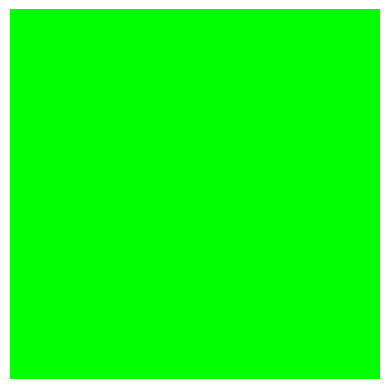

In [72]:
# paint image green
solid[:] = 0,255,0 # change all the pixels to 0, 255, 0
show(solid)

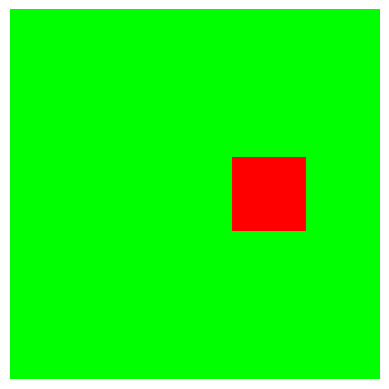

In [73]:
solid[200:300, 300:400] = 0,0,255 # give image range of pixels
show(solid)

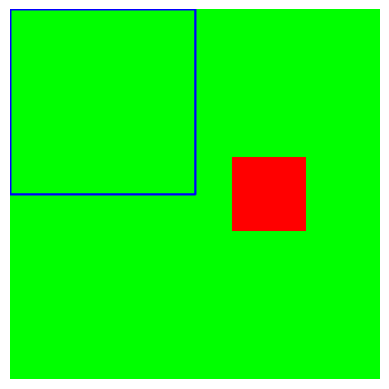

In [74]:
# draw rectange on image

cv.rectangle(solid, (0,0), (250,250), (255,0,0), thickness=2) # (img, pt1, pt2, color, thickness)
show(solid)

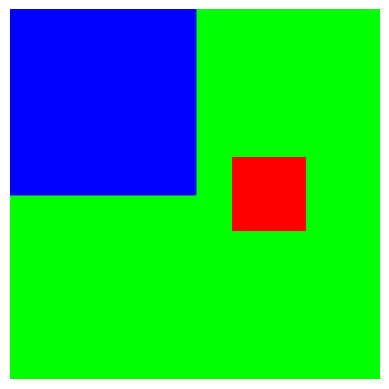

In [75]:
cv.rectangle(solid, (0, 0), (250, 250), (255, 0, 0), thickness=cv.FILLED) # can also use thickness=-1 instead of cv.FILLED
show(solid)

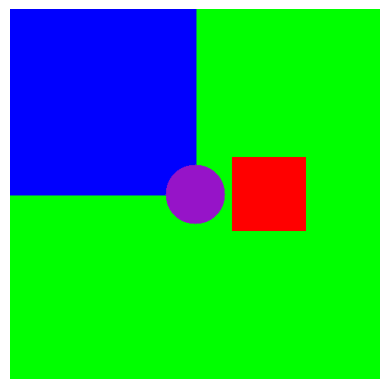

In [76]:
cv.circle(solid, (solid.shape[1]//2, solid.shape[0]//2), 40, (200,20,150), thickness=-1) # center coordinates, radius, color, thickness
show(solid)

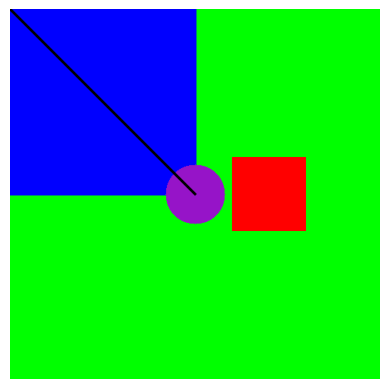

In [77]:
cv.line(solid, (0,0), (250,250), (0,0,0), thickness=2)
show(solid)

### **Converting image to grayscale**

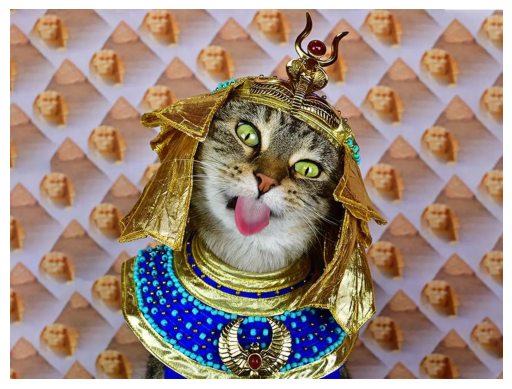

In [78]:
img = cv.imread(paths[1])
show(img)

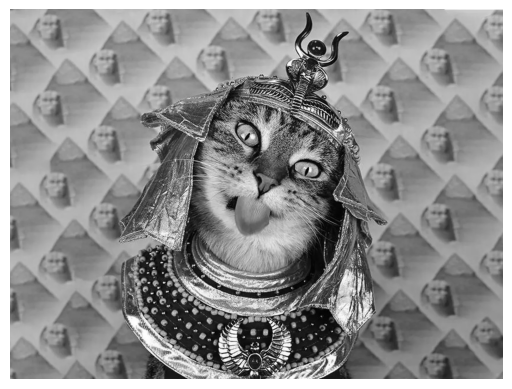

In [79]:
gray_img = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
show(gray_img)

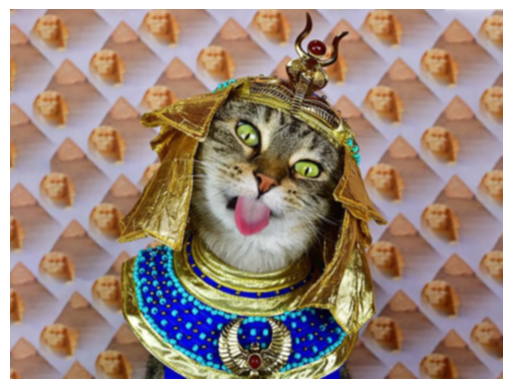

In [80]:
blur_img = cv.GaussianBlur(img, (7,7), cv.BORDER_DEFAULT) # increase kernel size to blur image
show(blur_img)

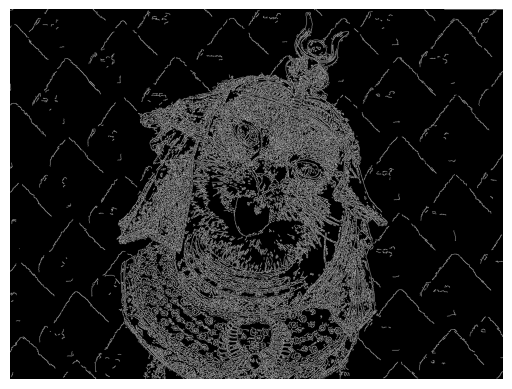

In [81]:
# edge cascade
canny_img = cv.Canny(img, 100, 150) #threshold values
show(canny_img)

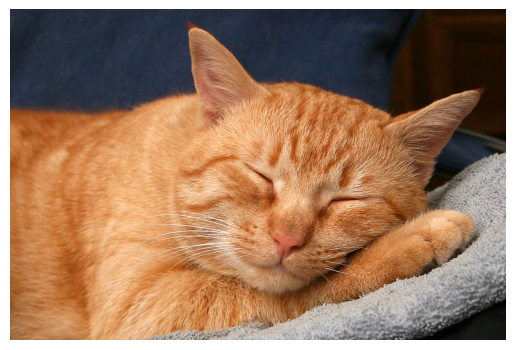

In [82]:
Img = cv.imread(paths[0])
show(Img)

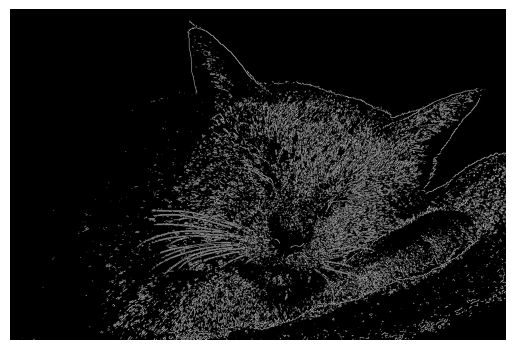

In [83]:
canny_Img = cv.Canny(Img, 200, 200)
show(canny_Img)

In [84]:
NL = cv.imread(paths[len(paths)-1])

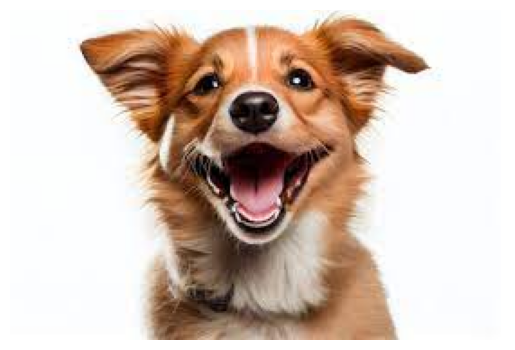

In [85]:
show(NL)

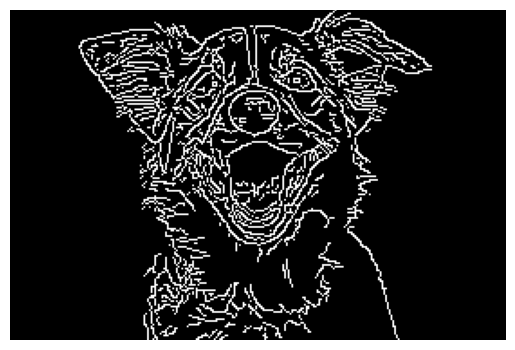

In [86]:
canny_NL = cv.Canny(NL, 175, 125)
show(canny_NL)

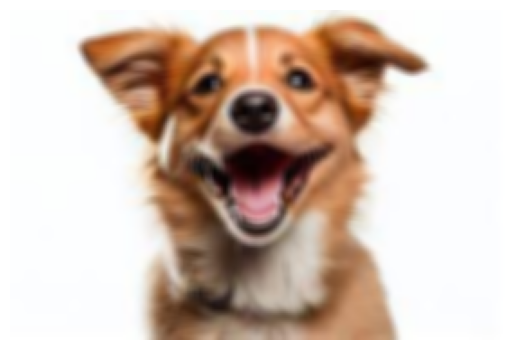

In [87]:
blur_NL = cv.GaussianBlur(NL, (5,5), cv.BORDER_DEFAULT)
show(blur_NL)

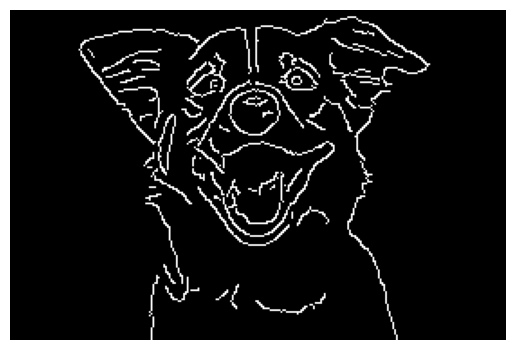

In [88]:
canny_blur_NL = cv.Canny(blur_NL, 175, 125)
show(canny_blur_NL)

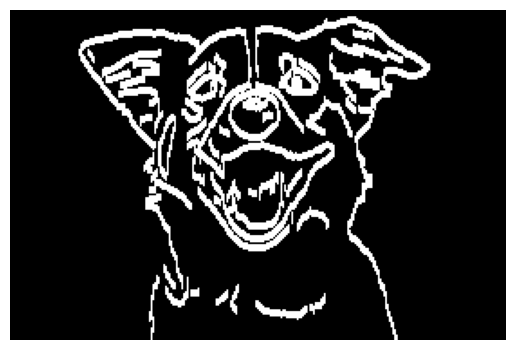

In [89]:
# dilation, takes structure input as canny edges, kernel size and iterations

dilated = cv.dilate(canny_blur_NL, (5,5), iterations=3)
show(dilated)

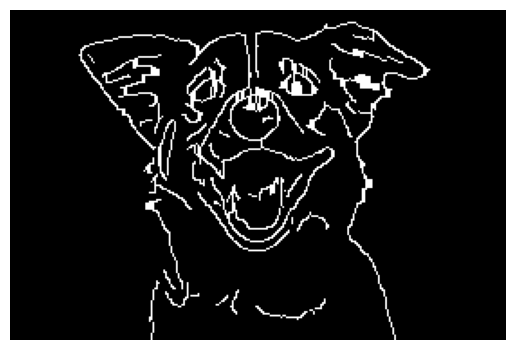

In [90]:
# eroding
eroded = cv.erode(dilated, (5,5), iterations=3)
show(eroded)

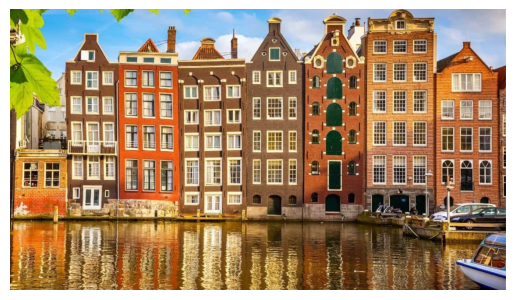

In [91]:
img = cv.imread(paths[2])
show(img)

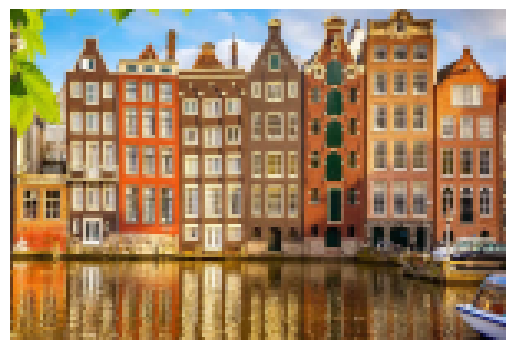

In [92]:
# cubic is the slowest, but image is of highest quality
resized = cv.resize(img, (150,100), interpolation=cv.INTER_AREA)
show(resized)

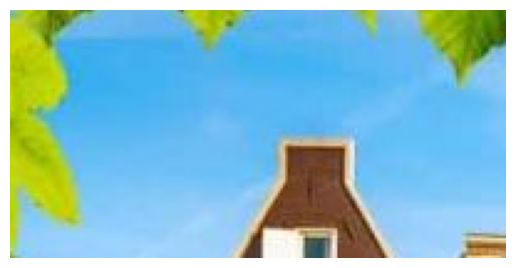

In [93]:
cropped = img[0:100, 50:250]
show(cropped)

### **Image transformations**

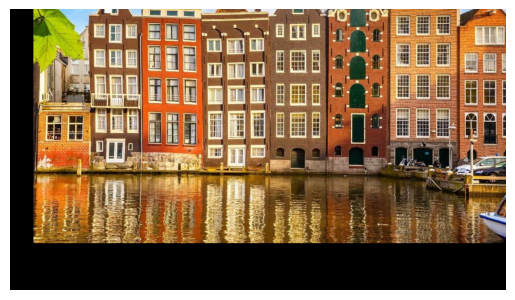

In [94]:
import numpy as np
def translate(img, x, y):
  trans_mat = np.float32([[1,0,x],[0,1,y]])
  dims = (img.shape[1], img.shape[0])
  return cv.warpAffine(img, trans_mat, dims)

# - x -> left
# -y -> up

show(translate(img, 50, -100))


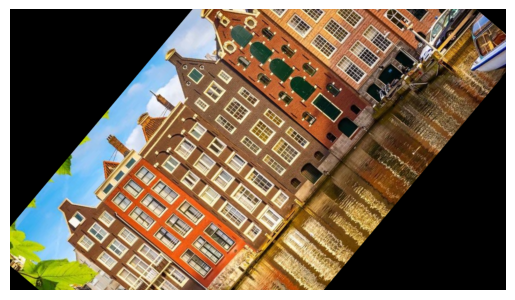

In [95]:
def rotate(img, angle, rotate_point=None):
  (height, width) = img.shape[:2]

  if rotate_point == None:
    rotate_point = (width//2, height//2)

  rotMat = cv.getRotationMatrix2D(rotate_point, angle, 1.0) # 1.0 is the scale
  dimensions = (width, height)

  return cv.warpAffine(img, rotMat, dimensions)


show(rotate(img, 50))

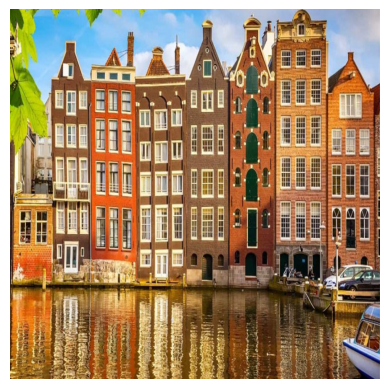

In [96]:
show(cv.resize(img, (5000,5000),  interpolation=cv.INTER_CUBIC))
# CUBIC is slow, but image is better
# if making smaller, go fo AREA (default), if enlarging, LINEAR or CUBIC

### **Contour Detection**

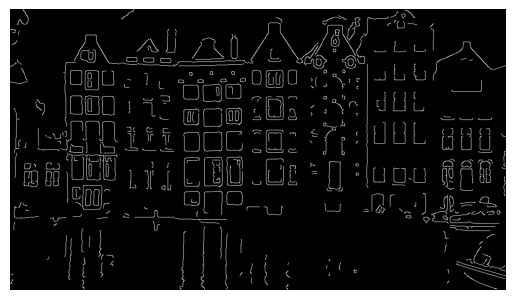

In [97]:
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
blur = cv.GaussianBlur(gray, (5,5), cv.BORDER_DEFAULT)
blur = cv.GaussianBlur(blur, (5,5), cv.BORDER_DEFAULT)
canny = cv.Canny(blur, 125, 175)
show(canny)

In [98]:
contours, hierarchies = cv.findContours(canny, cv.RETR_LIST, cv.CHAIN_APPROX_SIMPLE) # look up all parameters
print(f'{len(contours)} contours found')

550 contours found


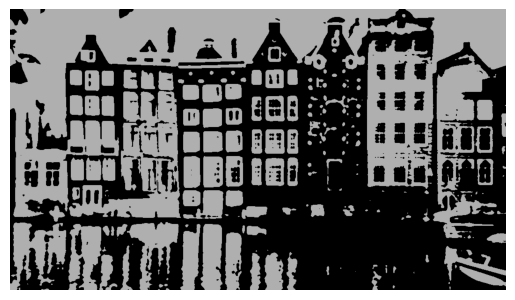

In [99]:
ret, thresh = cv.threshold(blur, 125, 175, cv.THRESH_BINARY)
show(thresh)

In [100]:
contours, heirarchies = cv.findContours(thresh, cv.RETR_LIST, cv.CHAIN_APPROX_SIMPLE)
print(f'{len(contours)} contours found') # 2 methods of creating contours

447 contours found


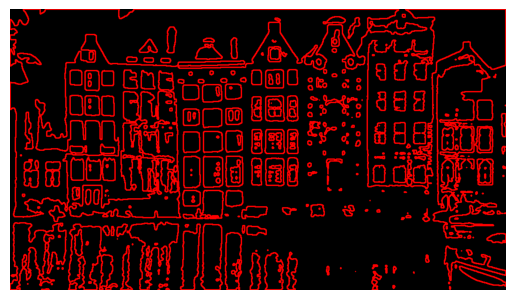

In [101]:
blank = np.zeros(img.shape, dtype='uint8')
cv.drawContours(blank, contours, -1, (0,0,255), 2) # -1 denotes all contours, then color, then thickness
show(blank) # contours are not the same thing as edges, but similar

### **Color Spaces**

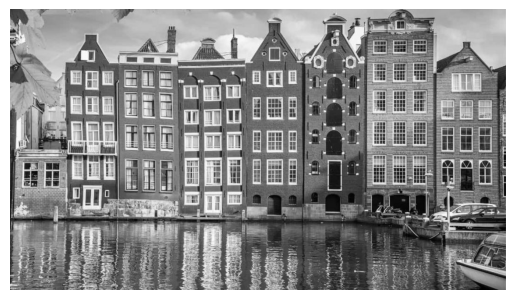

In [102]:
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
hsv = cv.cvtColor(img, cv.COLOR_BGR2HSV)
show(gray)

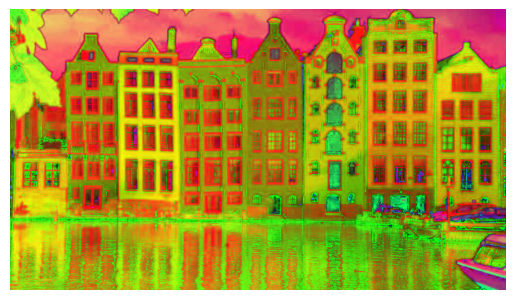

In [103]:
show(hsv)

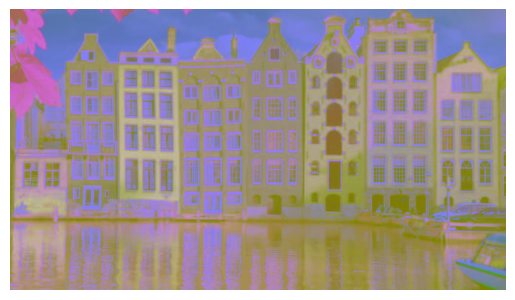

In [104]:
lab = cv.cvtColor(img, cv.COLOR_BGR2LAB)
show(lab)

### **Color Channels**

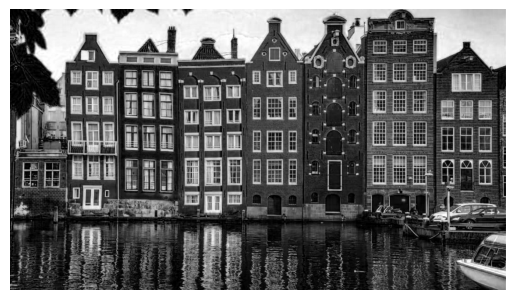

In [105]:
b, g, r = cv.split(img)
show(b)

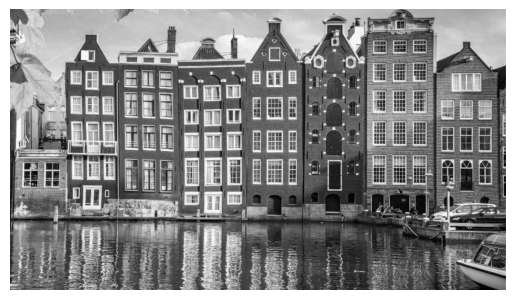

In [106]:
show(g)

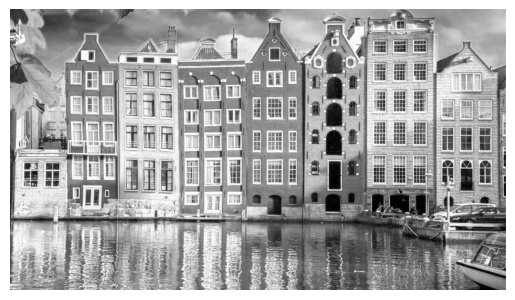

In [107]:
show(r)

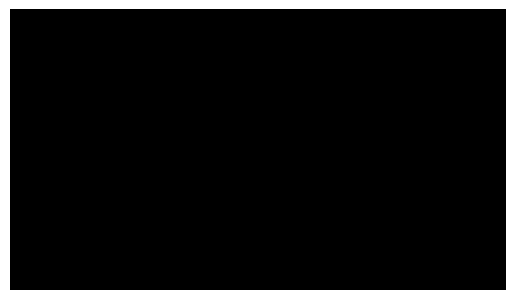

In [108]:
# represented as grayscale to denote pixel density
# lighter parts show higher concentration of pixels
blank = np.zeros(img.shape[:2], dtype='uint8')
show(blank)

In [109]:
b, g, r = cv.split(img)
blue = cv.merge([b, blank, blank])
green = cv.merge([blank, g, blank])
red = cv.merge([blank, blank, r])


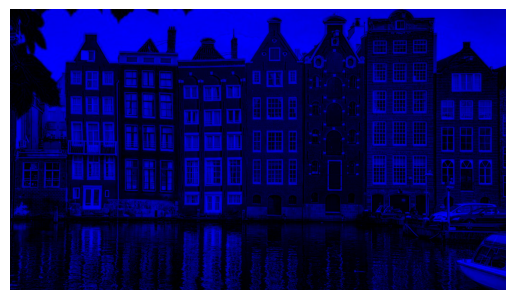

In [110]:
show(blue)

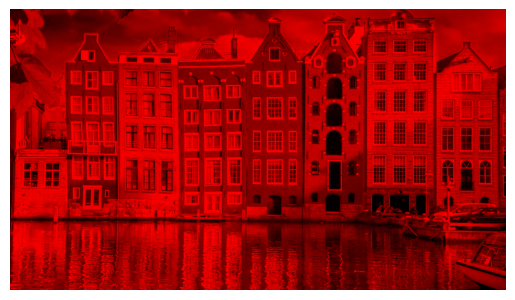

In [111]:
show(red)

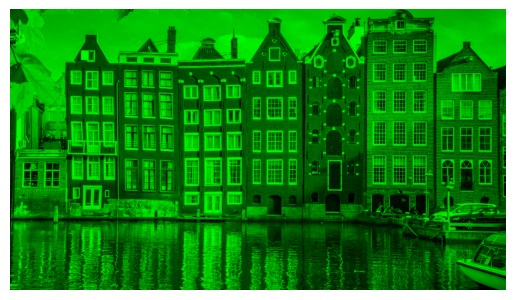

In [112]:
show(green)

### **Blurring**

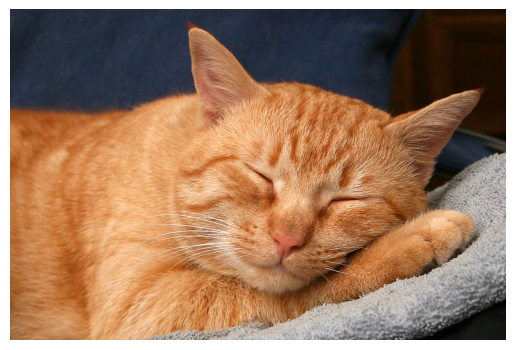

In [113]:
Img = cv.imread(paths[0])
show(Img)

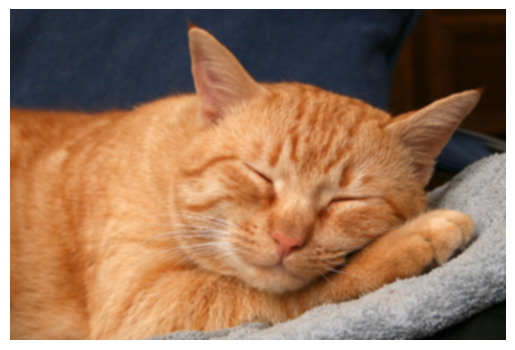

In [114]:
average = cv.blur(Img, (7,7)) # average blur, middle pixel is average of surrounding pixels
show(average)

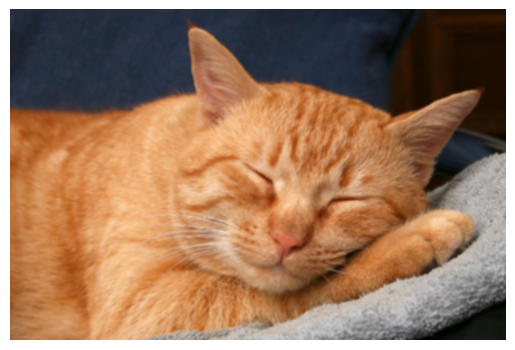

In [115]:
gaussian = cv.GaussianBlur(Img, (7,7), cv.BORDER_DEFAULT) # gaussian blur, middle pixel is weighted mean of surrounding
show(gaussian)
# usually less blurring than average blur, but is more natural

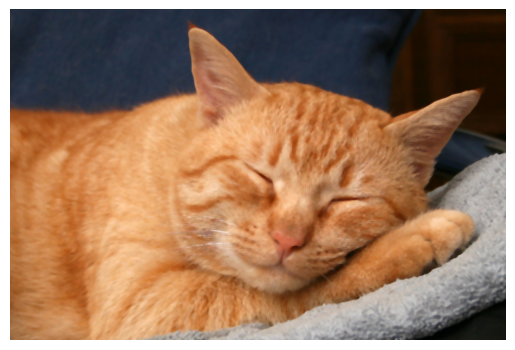

In [116]:
median = cv.medianBlur(Img, 7) # general not meant for higher kernel sizes
show(median)

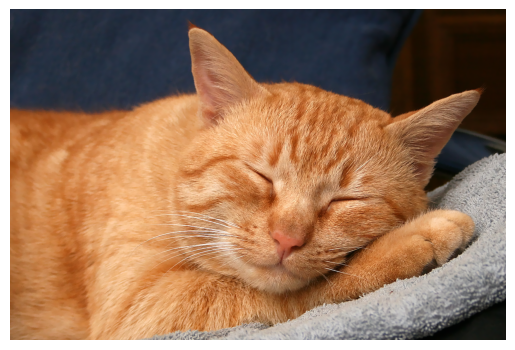

In [117]:
bilateral = cv.bilateralFilter(Img, 10, 15, 15)
# (Img, diameter, sigmaColor , sigmaSpace)
# higher sigmaColor denotes higher number of colors from neighorhood considered
# higher sigmaSpace denotes pixels further away will influence blurring of a particular image
show(bilateral)

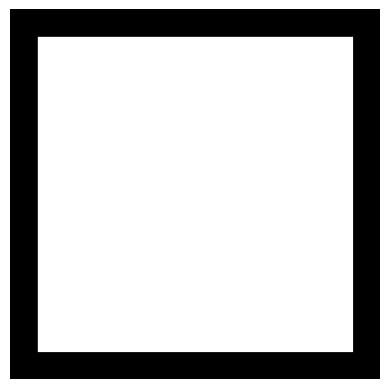

In [126]:
blank = np.zeros((400,400), dtype='uint8')
rectangle = cv.rectangle(blank.copy(), (30,30), (370,370), 255, -1) # -1 thickness to fill
circle = cv.circle(blank.copy(), (200,200), 200, 255, -1)
show(rectangle)

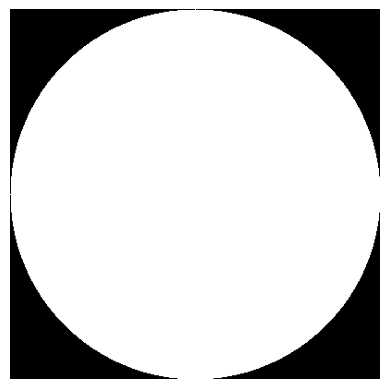

In [127]:
show(circle)

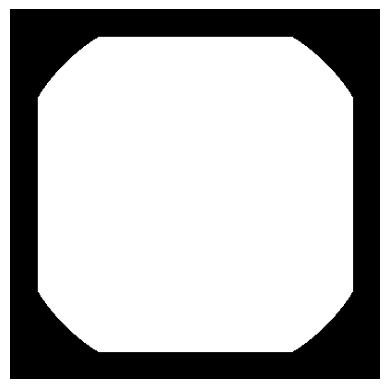

In [129]:
bitwise_and = cv.bitwise_and(rectangle, circle)
show(bitwise_and)

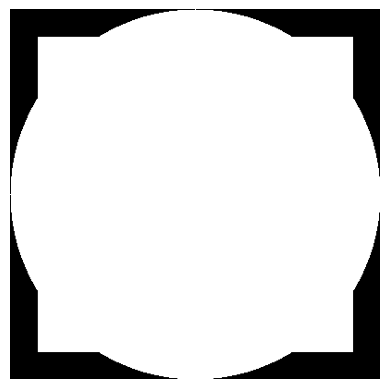

In [132]:
bitwise_or = cv.bitwise_or(rectangle, circle)
show(bitwise_or)

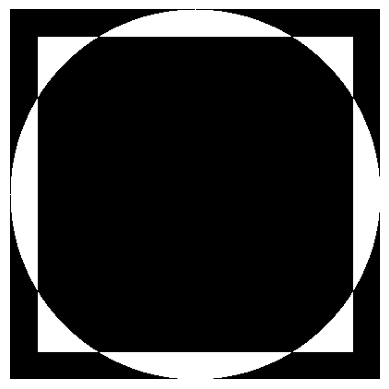

In [131]:
bitwise_xor = cv.bitwise_xor(rectangle, circle)
show(bitwise_xor)

### **Masked**

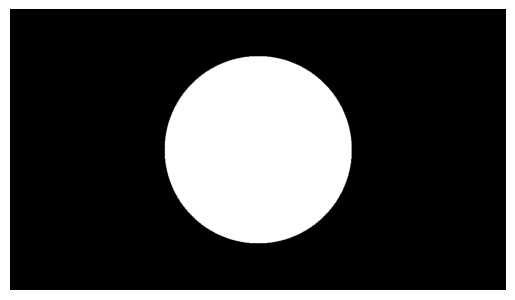

In [134]:
blank = np.zeros(img.shape[:2], dtype='uint8')
mask = cv.circle(blank, (img.shape[1]//2,img.shape[0]//2), 200, 255, -1)
show(mask)

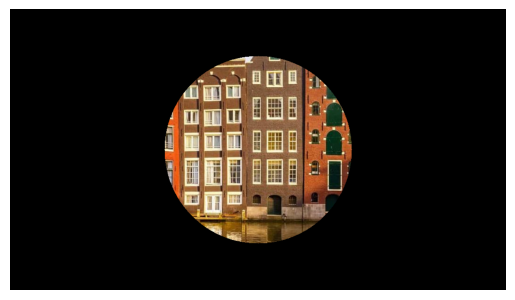

In [135]:
masked = cv.bitwise_and(img, img, mask=mask)
show(masked)

### **Thresholding/Binarizing**

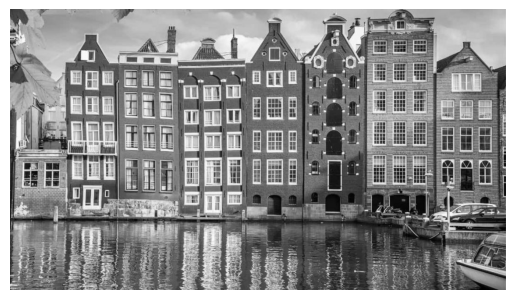

In [136]:
show(gray)

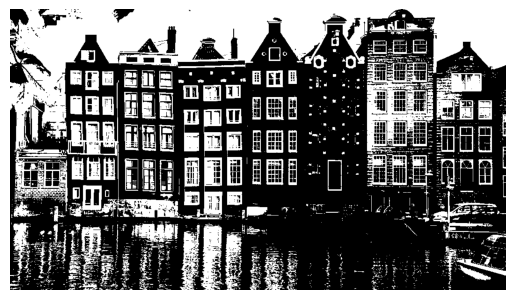

In [143]:
threshold, thresh = cv.threshold(gray, 150, 255, cv.THRESH_BINARY) # 150 is theshold,if pixel value above that, it will set to 255, or else 0
show(thresh)

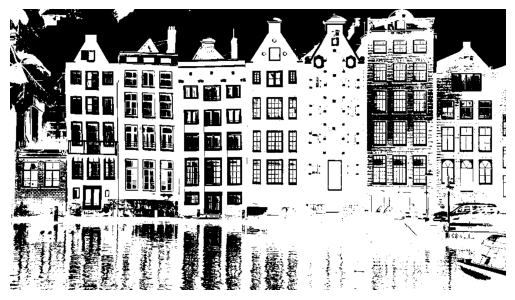

In [144]:
threshold, thresh_inv = cv.threshold(gray, 150, 255, cv.THRESH_BINARY_INV)
show(thresh_inv)

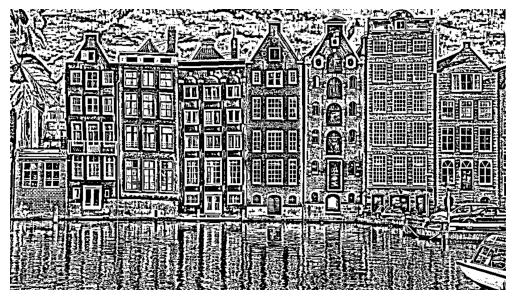

In [148]:
adaptive_thresh = cv.adaptiveThreshold(gray, 255, cv.ADAPTIVE_THRESH_MEAN_C, cv.THRESH_BINARY, 11, 1) # 11 is block/kernel size and 1 is the c value (to subtract from mean to finetune threshold)
show(adaptive_thresh)

### **Edge Detection**

In [ ]:
# look up later